In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

Write a python program for image negative and log transform for greyscale and colour images.

Original color Image


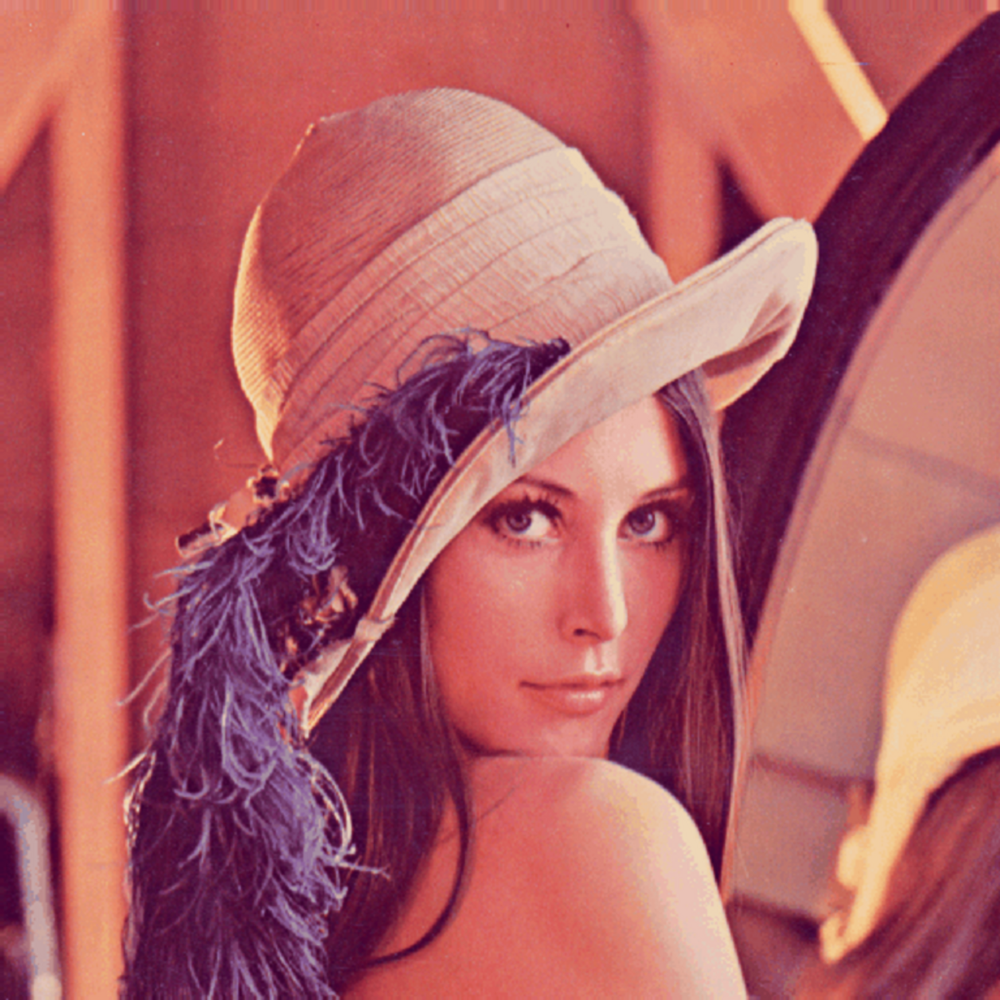

Original gray Image


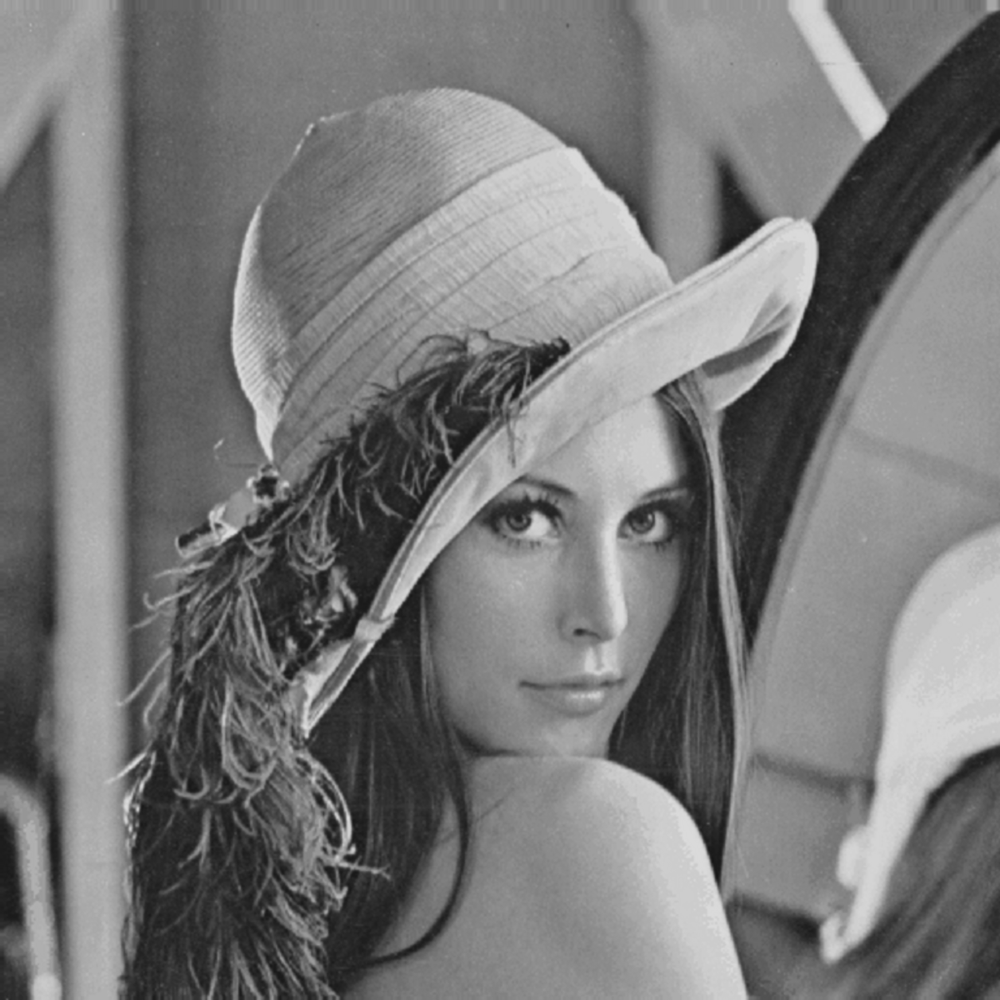

Negative color Image


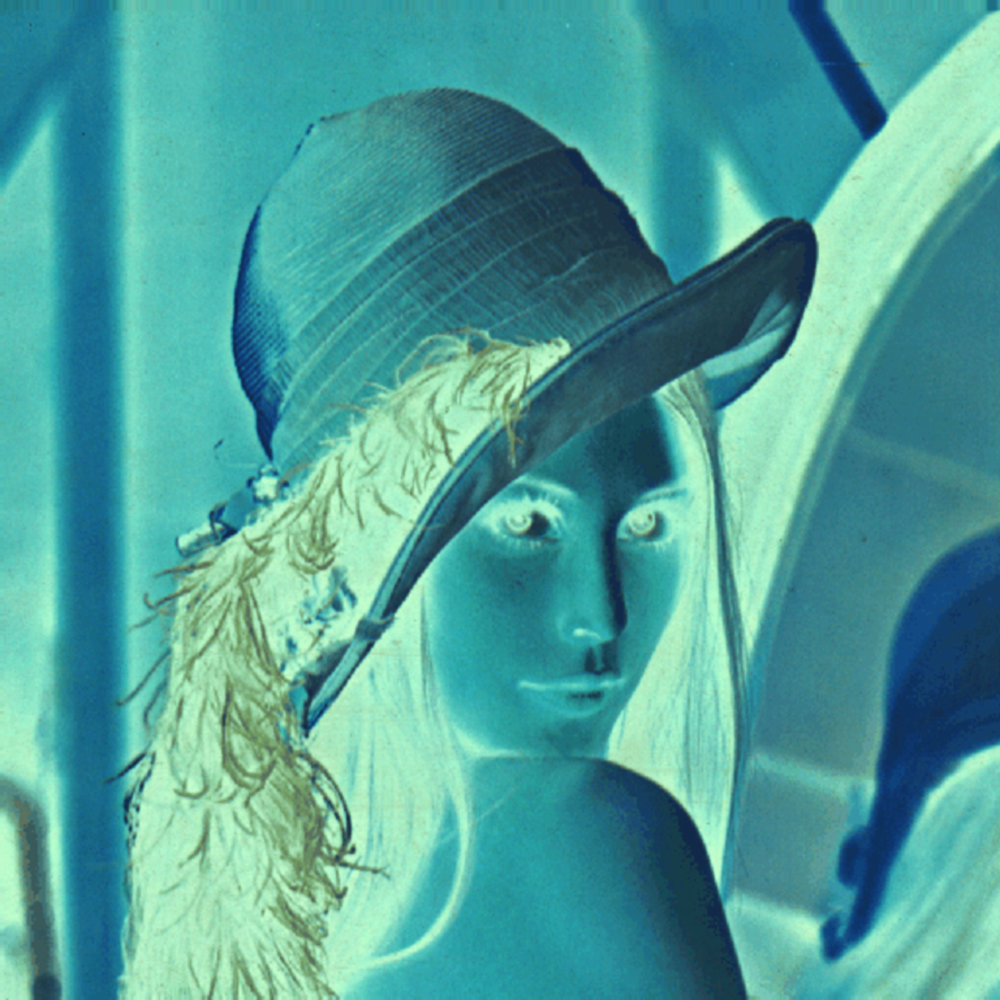

Negative gray Image


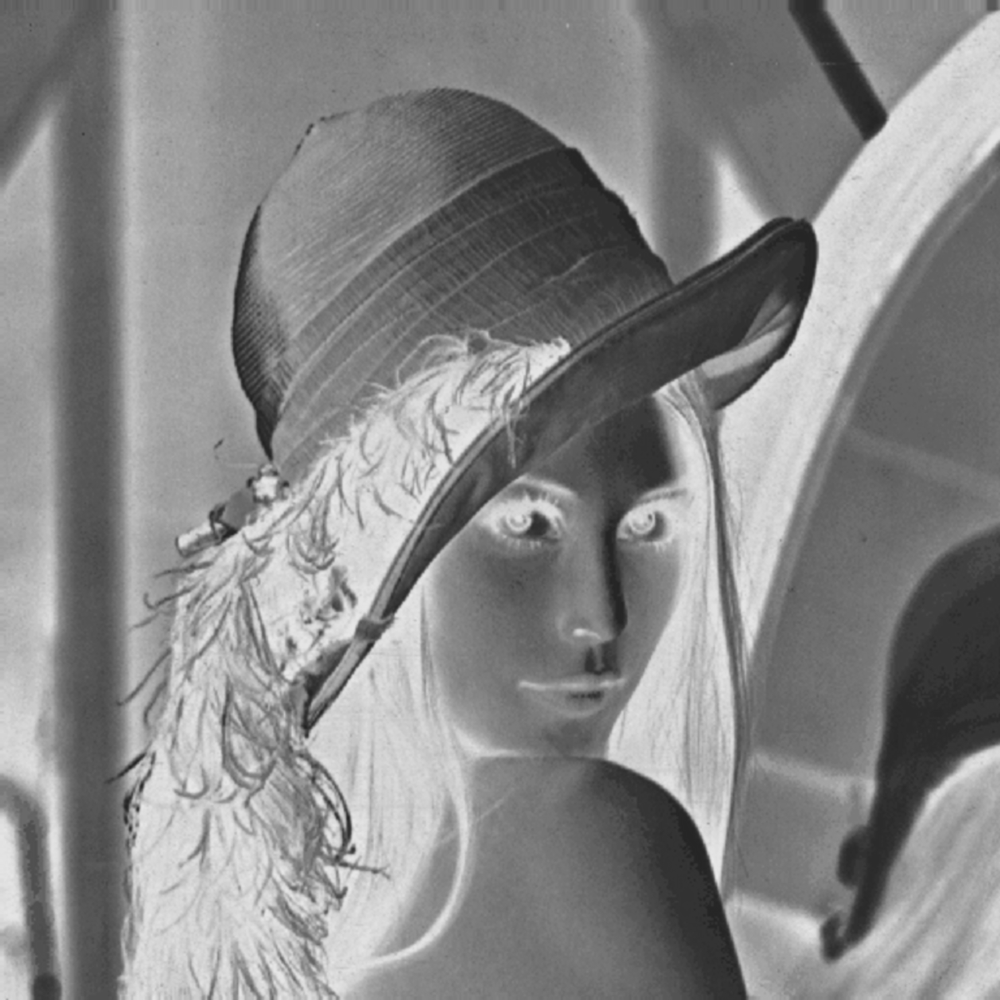

Log Transformed color Image


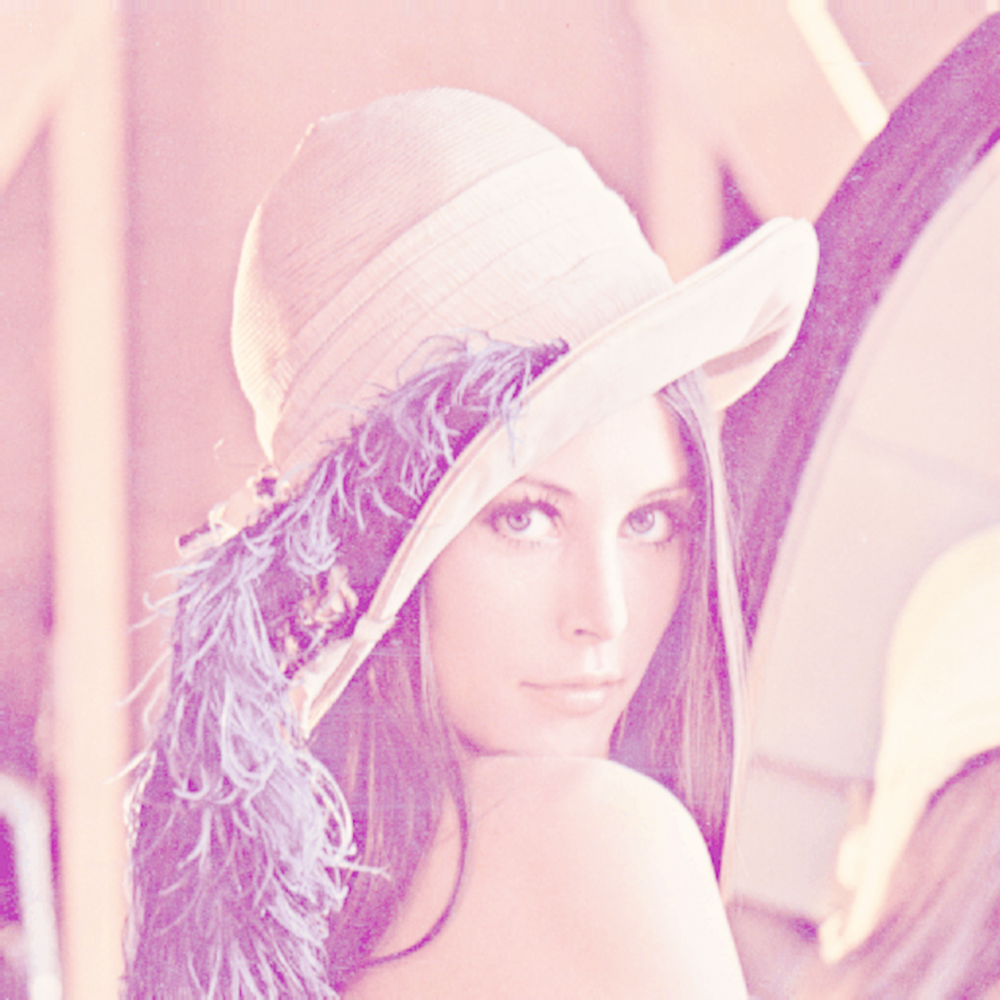

Log Transformed gray Image


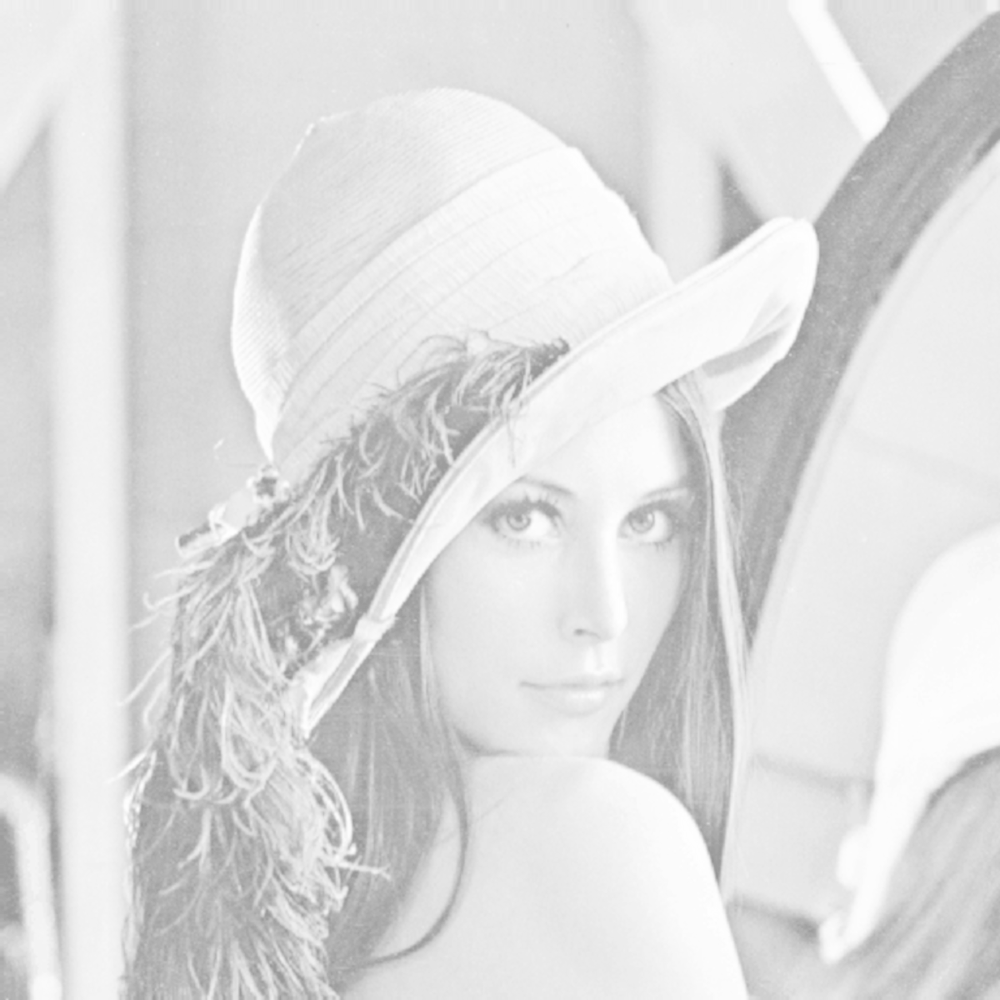

In [ ]:
img=cv2.imread("Lena_color.png")
print("Original color Image")
cv2_imshow(img)
img_gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
print("Original gray Image")
cv2_imshow(img_gray)
img_neg=255-img
print("Negative color Image")
cv2_imshow(img_neg)
img_neg=255-img_gray
print("Negative gray Image")
cv2_imshow(img_neg)
c=255/np.log(1+np.max(img))
log_img=c*np.log(1+img)
log_img=np.array(log_img,dtype=np.uint8)
print("Log Transformed color Image")
cv2_imshow(log_img)
c=255/np.log(1+np.max(img_gray))
log_img=c*np.log(1+img_gray)
log_img=np.array(log_img,dtype=np.uint8)
print("Log Transformed gray Image")
cv2_imshow(log_img)

**Write a python program for gray level slicing with background for grayscale images**

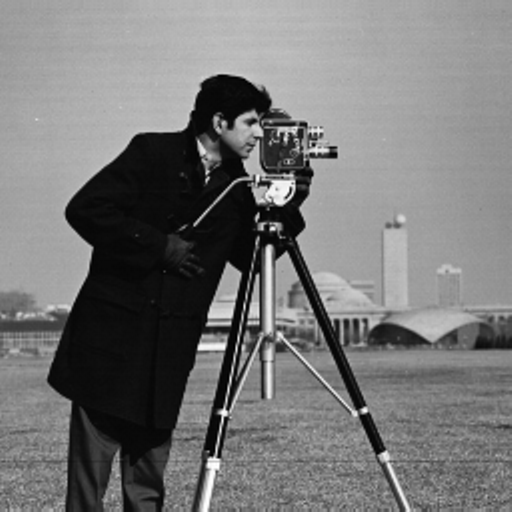

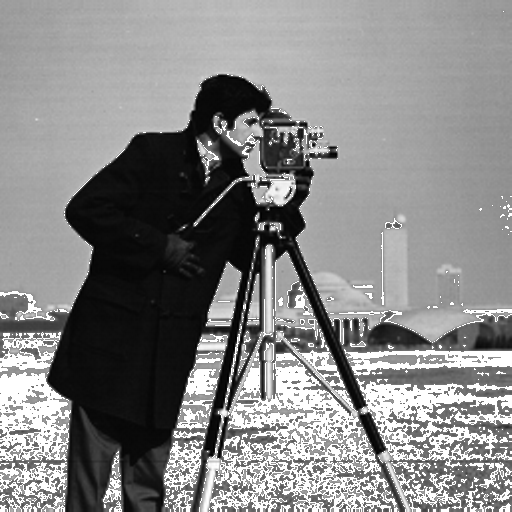

In [ ]:
img=cv2.imread("cameraman.tif",0)
cv2_imshow(img)
row,col=img.shape
t1=120
t2=140
img1=np.zeros((row,col),dtype=np.uint8)
for i in range(row):
  for j in range(col):
    if img[i,j]>=t1 and img[i,j]<=t2:
      img1[i,j]=255
    else:
      img1[i,j]=img[i,j] #img1[i,j]= 0 #for without background
cv2_imshow(img1)

**Write a python program for contrast stretching for grayscale images:**

Original Image


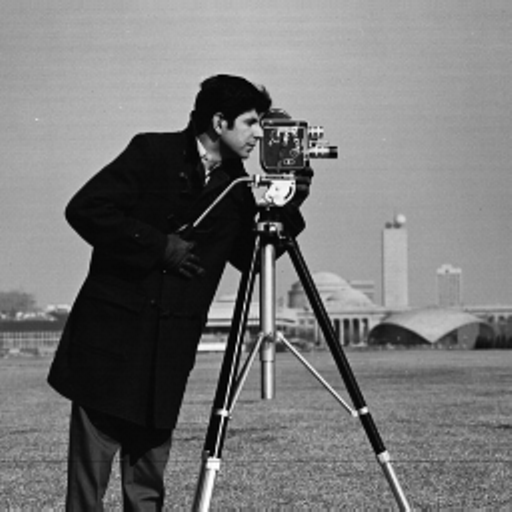

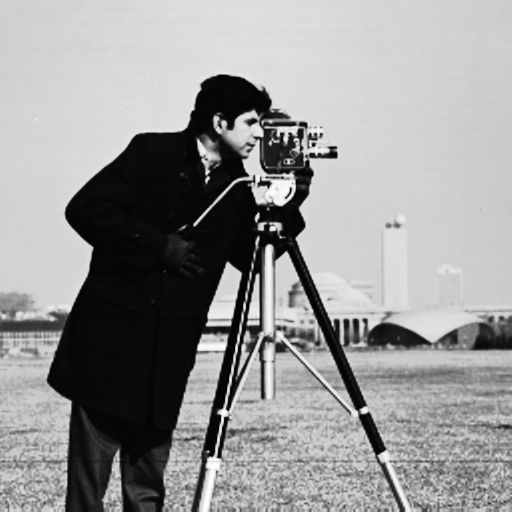

Contrast stretched image


In [ ]:

# Find line equations by calculating slopes
def Contrast_stretch(p, r1, s1, r2, s2): #p is the pixel value
    if (0 <= p and p <= r1):
        equation = (s1 / r1)*p        #alpha=s1/r1  and s=alpha*p
    elif (r1 < p and p <= r2):
        equation = ((s2 - s1)/(r2 - r1))*(p - r1)+s1   #beta=(s2-s1)/(r2-r1) and s=beta*(p-r1)+s1
    else:
        equation = ((255 - s2)/(255 - r2))*(p - r2)+s2  #gamma=((L-1)-s2)/((L-1)_r2) and s=gamma*(p-r2)+s2
    return equation   #instead of equations we can directly assign the values to all three parameters

# Read original image
image = cv2.imread('cameraman.tif')
print("Original Image")
cv2_imshow(image)

# Initialize range
r1 = 55
s1 = 40
r2 = 140
s2 = 200


pixelVal_vec = np.vectorize(Contrast_stretch)

# Contrast stretching
contrast = pixelVal_vec(image, r1, s1, r2, s2)
cv2_imshow(contrast)
print("Contrast stretched image")

**Write a python code for histogram equalization for a grayscale
image.**

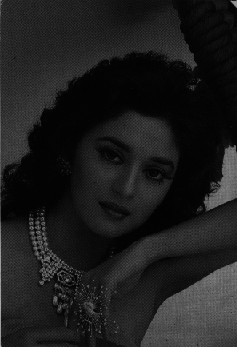

Original Image


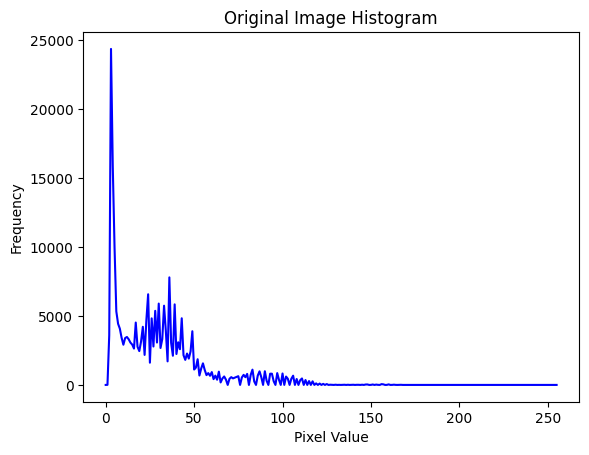

In [ ]:
img=cv2.imread('MAD.TIF')
cv2_imshow(img)
print("Original Image")
def plot_hist(img):
  flat=img.flatten()
  hist=np.zeros(256, dtype=int)
  for i in flat:
    hist[i]+=1
  return hist
ori_hist=plot_hist(img)
plt.title("Original Image Histogram")
plt.plot(ori_hist,color='blue')
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()

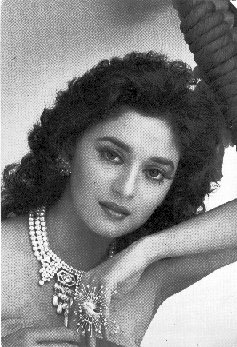

Equalized Image


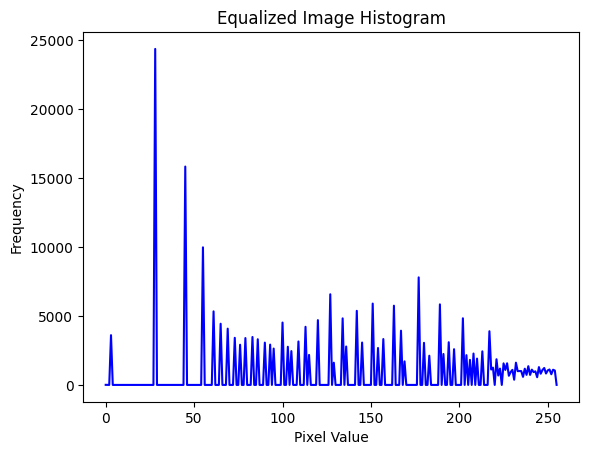

In [ ]:
cdf=ori_hist.cumsum()
cdf_min=cdf.min()
cdf_range=cdf.max()-cdf_min
cdf_range
cdf_normalized=((cdf-cdf_min)*255)/cdf_range
cdf_normalized=cdf_normalized.astype('uint8')
equalized_img=cdf_normalized[img]
cv2_imshow(equalized_img)
print("Equalized Image")
eql_hist=plot_hist(equalized_img)
plt.title("Equalized Image Histogram")
plt.plot(eql_hist,color='blue')
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()

**Write a python program for averaging filter.**
**averaging filter=Low pass filter**

Original Image


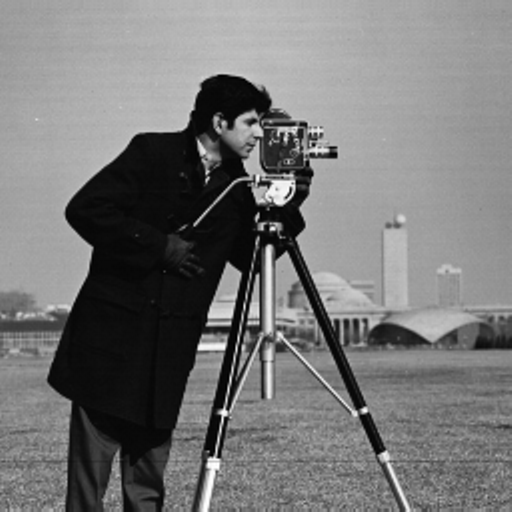

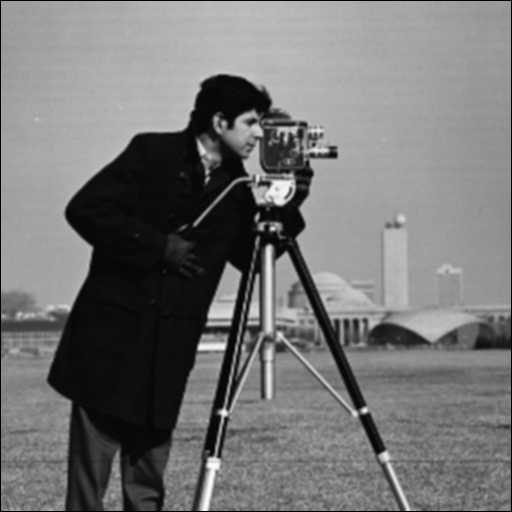

Filtered Image


In [ ]:
I=cv2.imread("cameraman.tif")
img=cv2.cvtColor(I,cv2.COLOR_BGR2GRAY)
print("Original Image")
cv2_imshow(img)
m, n= img.shape
mask=np.ones((3,3),dtype=int)
filt=mask/9
img_new=np.zeros_like(img, dtype=np.uint8)
for i in range(1, m-1):
  for j in range(1, n-1):
    region = img[i-1:i+2, j-1:j+2]
    img_new[i,j]=np.sum(region*filt)
cv2_imshow(img_new)
print("Filtered Image")

**Write a python program for sobel and prewitt.**

Original Image


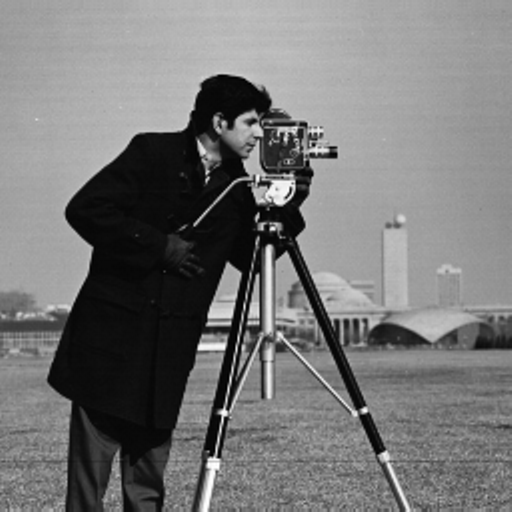

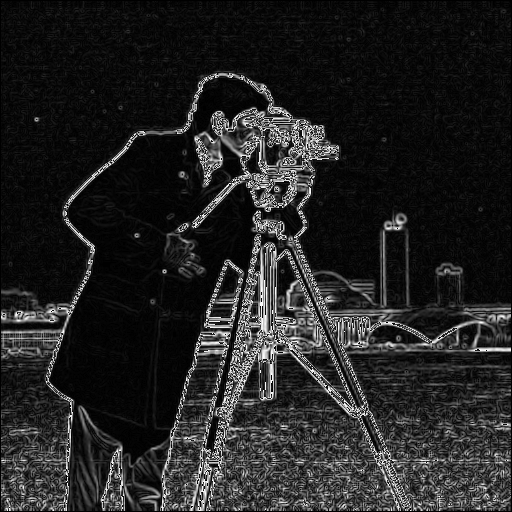

Sobel Filtered Image


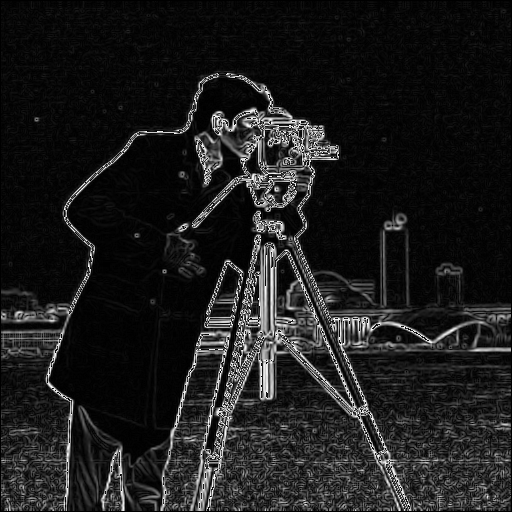

Prewitt Filtered Image


In [ ]:
I=cv2.imread("cameraman.tif")
img=cv2.cvtColor(I,cv2.COLOR_BGR2GRAY)
print("Original Image")
cv2_imshow(img)
sobel_x=np.array([[-1,0,1],
                  [-2,0,2],
                 [-1,0,1]])
sobel_y=np.array([[-1,-2,-1],
                 [0,0,0],
                 [1,2,1]])
prewit_x=np.array([[1,1,1],
                  [0,0,0],
                  [-1,-1,-1]])
prewit_y=np.array([[-1,0,1],
                  [-1,0,1],
                  [-1,0,1]])
sobel_img=np.zeros_like(img, dtype=np.uint8)
prewit_img=np.zeros_like(img, dtype=np.uint8)
m, n=img.shape
for i in range(1,m-1):
  for j in range(1,n-1):
    region=img[i-1:i+2,j-1:j+2]
    gx_s=np.sum(region*sobel_x)
    gy_s=np.sum(region*sobel_y)
    sobel_img[i,j]=np.sqrt(gx_s**2+gy_s**2)

    gx_p=np.sum(region*prewit_x)
    gy_p=np.sum(region*prewit_y)
    prewit_img[i,j]=np.sqrt(gx_p**2+gy_p**2)
soble_img=sobel_img.astype('uint8')
prewit_img=prewit_img.astype('uint8')
cv2_imshow(sobel_img)
print("Sobel Filtered Image")
cv2_imshow(prewit_img)
print("Prewitt Filtered Image")


**Write a python program for low pass filter in frequency domain.**

Original Image


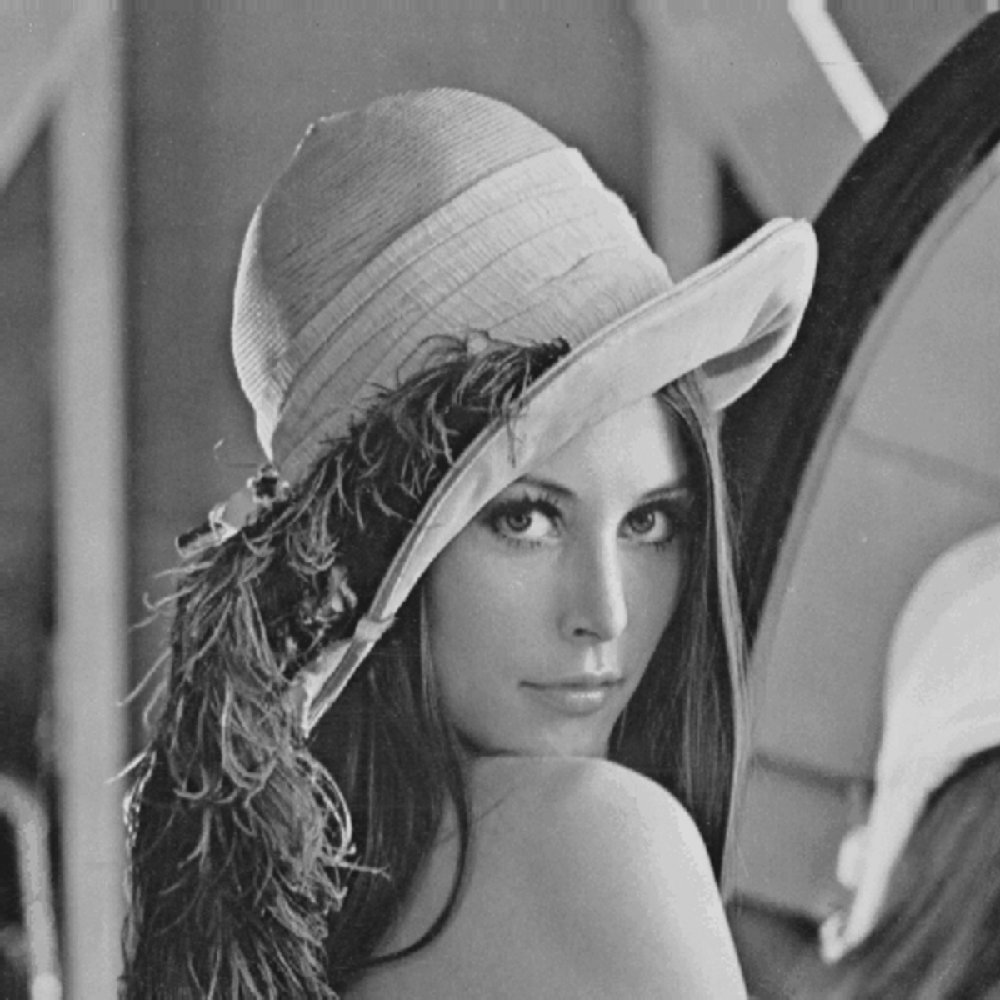

/usr/local/lib/python3.11/dist-packages/google/colab/patches/__init__.py:18: ComplexWarning: Casting complex values to real discards the imaginary part
  a = a.clip(0, 255).astype('uint8')


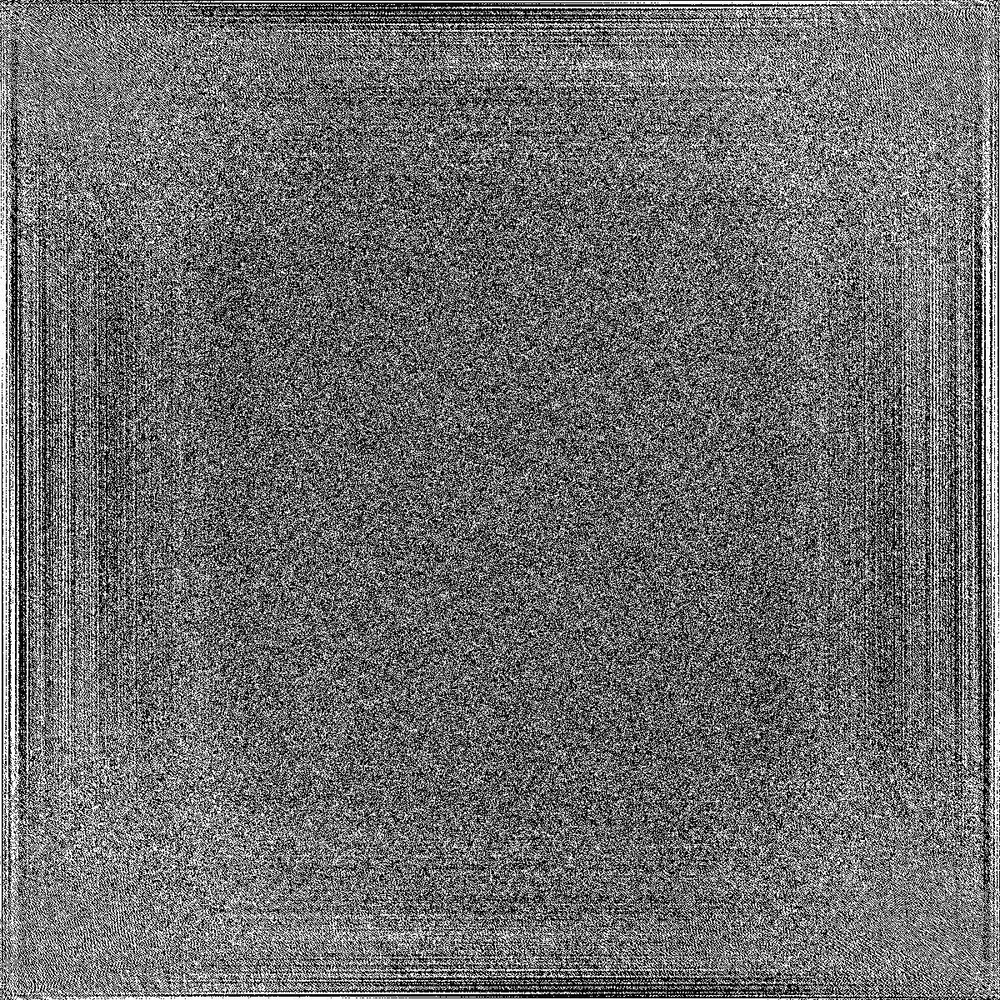

FFT


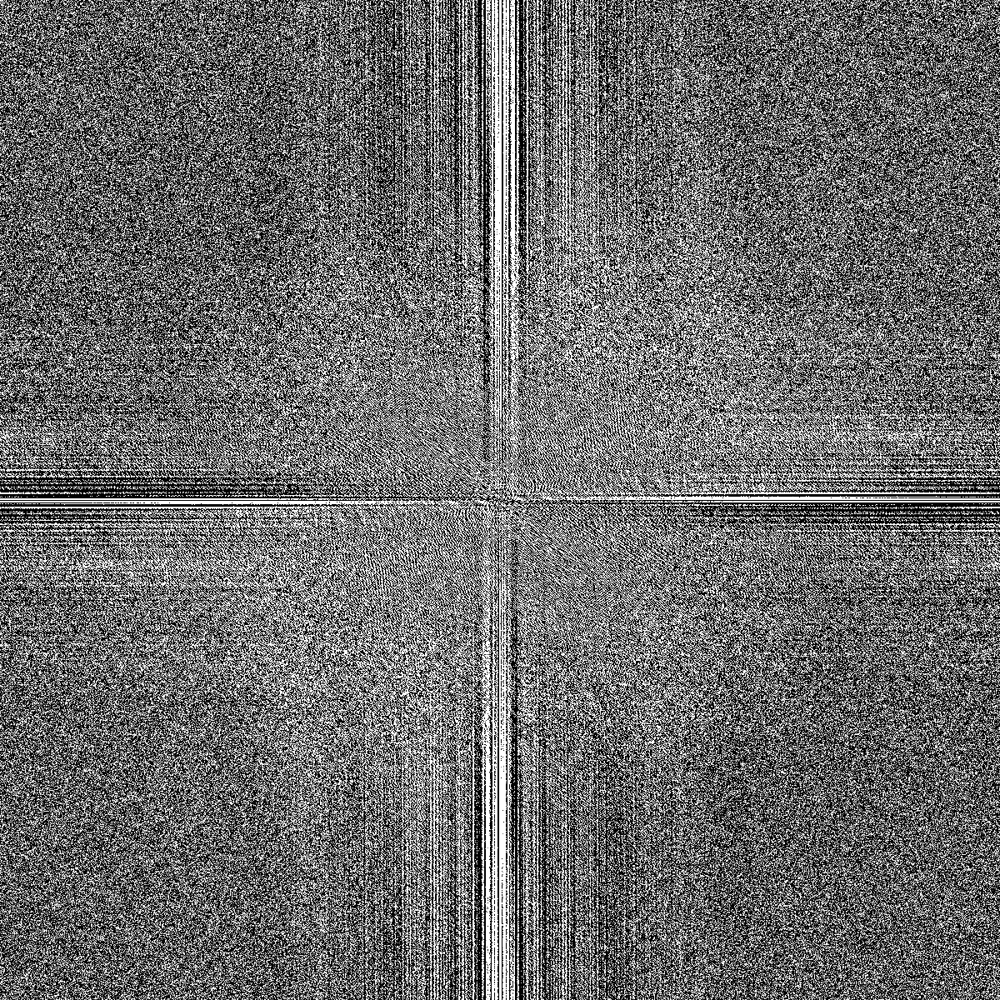

FFT Shift


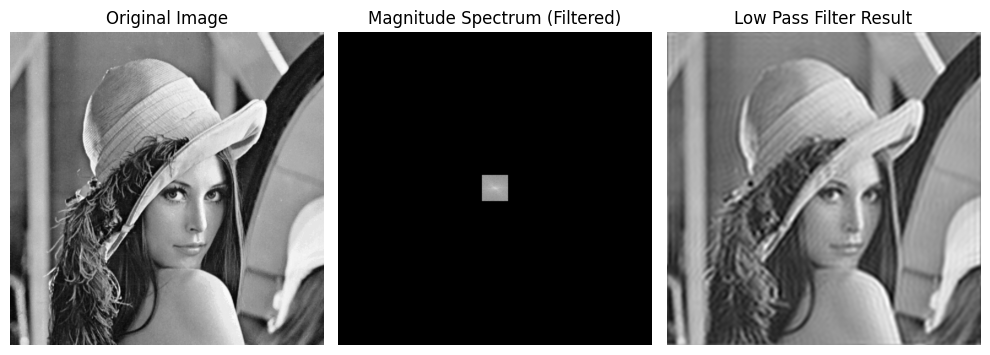

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load grayscale image
img = cv2.imread('Lena_color.png',0)
print("Original Image")
cv2_imshow(img)

# Get image size
rows, cols = img.shape
crow, ccol = rows // 2 , cols // 2  # center

# Apply 2D FFT
dft = np.fft.fft2(img)
cv2_imshow(dft)
print("FFT")
# Shift the zero-frequency component to the center of the spectrum
dft_shift = np.fft.fftshift(dft)
cv2_imshow(dft_shift)
print("FFT Shift")

# Create a low pass mask with a square region of 1's at center
mask = np.zeros((rows, cols), np.uint8)
r = 50  # Radius of low pass region (adjust for more/less blur)
mask[crow-r:crow+r, ccol-r:ccol+r] = 1

# Apply mask and inverse FFT
filtered = dft_shift * mask
f_ishift = np.fft.ifftshift(filtered)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

# Display results
plt.figure(figsize=(10,4))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Magnitude Spectrum (Filtered)")
plt.imshow(20 * np.log(np.abs(filtered) + 1), cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Low Pass Filter Result")
plt.imshow(img_back, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


**Write a python program for erosion and dilation for binary and
gray scale image.**

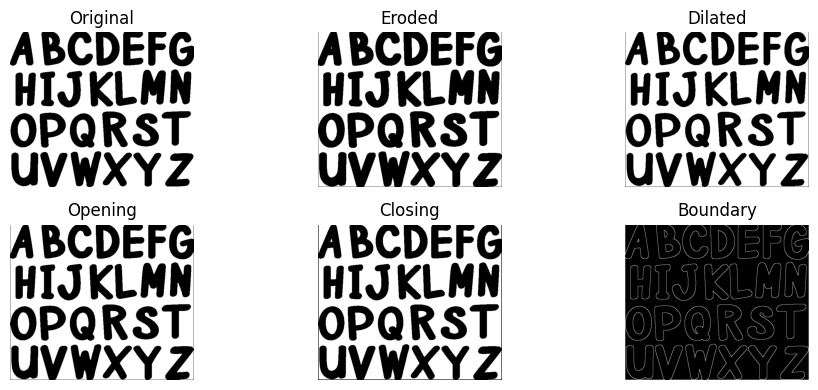

In [ ]:
I=cv2.imread('alphabates.jpg',0)
t=127
m,n=I.shape
for i in range(1,m-1):
  for j in range(1,n-1):
    if I[i,j]>t:
      I[i,j]=255
    else:
      I[i,j]=0
img=I
def erosion(img):
  eroded = np.zeros_like(img, dtype=np.uint8)
  for i in range(1,m-1):
    for j in range(1,n-1):
      eroded[i,j]=np.min(img[i-1:i+2,j-1:j+2])
  return eroded

def dilation(img):
  dilated = np.zeros_like(img, dtype=np.uint8)
  for i in range(1,m-1):
    for j in range(1,n-1):
      dilated[i,j]=np.max(img[i-1:i+2,j-1:j+2])
  return dilated
eroded_img=erosion(img)
dilated_img=dilation(img)
opening=dilation(eroded_img)
closing=erosion(dilated_img)
boundary=img-eroded_img
titles=['Original','Eroded','Dilated','Opening','Closing','Boundary']
images=[img,eroded_img,dilated_img,opening,closing,boundary]
plt.figure(figsize=(10,4))
for i in range(len(titles)):
  plt.subplot(2,3,i+1)
  plt.title(titles[i])
  plt.imshow(images[i],cmap='gray')
  plt.axis('off')
plt.tight_layout()
plt.show()

**Write a python program for global thresholding for a colour
and a grayscale image.**

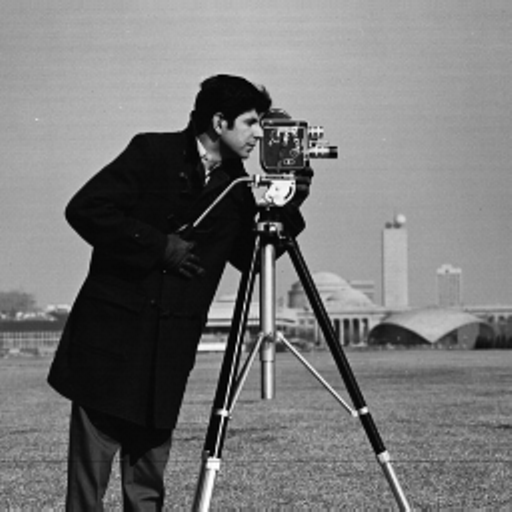

Original Image


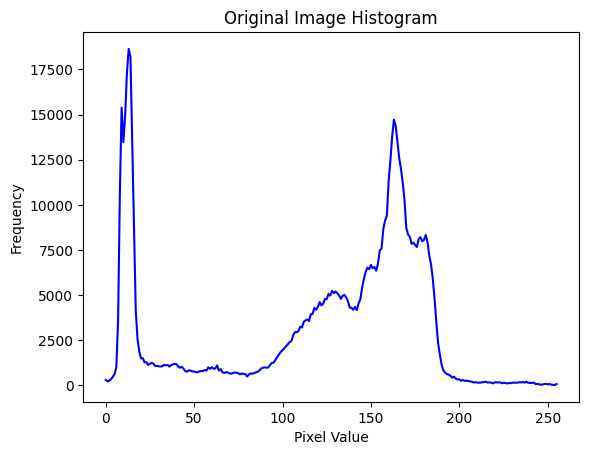

Enter the value of threshold: 90


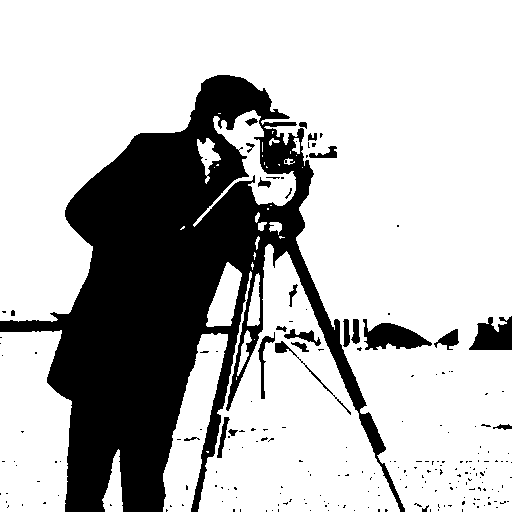

Binary Image


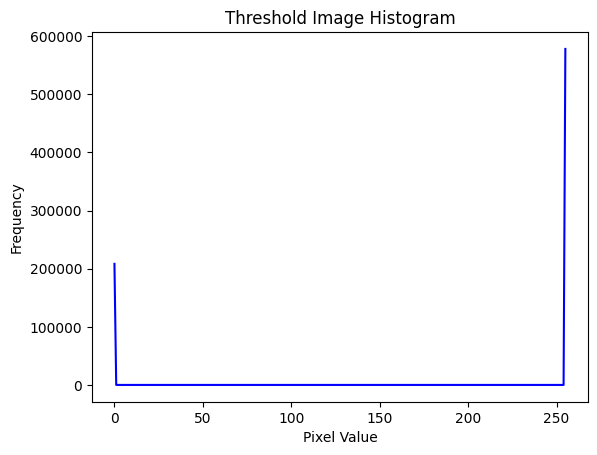

In [10]:
img=cv2.imread('cameraman.tif')
cv2_imshow(img)
print("Original Image")
def plot_hist(img):
  flat=img.flatten()
  hist=np.zeros(256, dtype=int)
  for i in flat:
    hist[i]+=1
  return hist
ori_hist=plot_hist(img)
plt.title("Original Image Histogram")
plt.plot(ori_hist,color='blue')
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()
t=int(input("Enter the value of threshold: "))
while True:
  g1=img[img>t]
  g2=img[img<=t]
  if len(g1)==0 or len(g2)==0:
    break
  m1=np.average(g1)
  m2=np.average(g2)
  t_new=0.5*abs(m1+m2)
  if abs(t-t_new)<1:
    break
  t=t_new
binary=np.zeros_like(img)
binary[img>t]=255
cv2_imshow(binary)
print("Binary Image")
thre_hist=plot_hist(binary)
plt.title("Threshold Image Histogram")
plt.plot(thre_hist,color='blue')
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()


**Write a program to find adaptive thresholded image.**

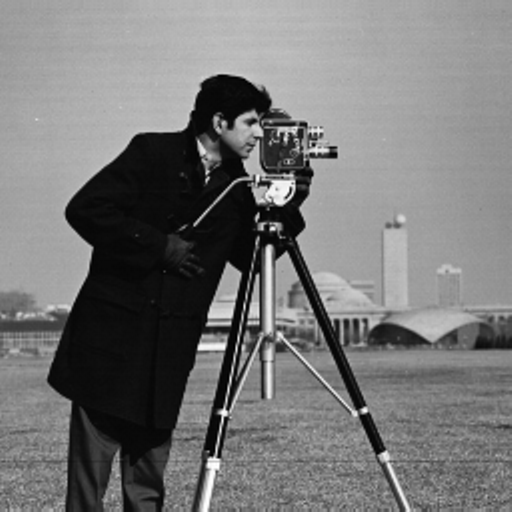

Original image


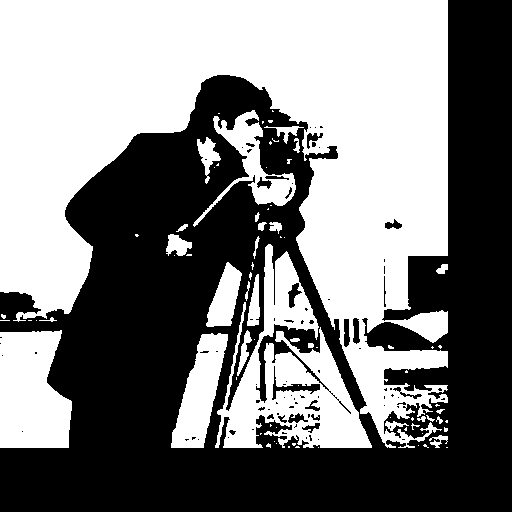

Adaptive thresholded image


In [14]:
img=cv2.imread('cameraman.tif',0)
cv2_imshow(img)
print("Original image")
def adaptive_threshold(img,block_size=64):
  h,w=img.shape
  result=np.zeros_like(img)
  for i in range(0,h-block_size,block_size):
    for j in range(0,w-block_size,block_size):
      block=img[i:i+block_size,j:j+block_size]
      T=128
      while True:
        g1=block[block>T]
        g2=block[block<=T]
        if len(g1)==0 or len(g2)==0:
          break
        m1=np.average(g1)
        m2=np.average(g2)
        T_new=0.5*abs(m1+m2)
        if abs(T_new-T)<1:
          break
        T=T_new
      binary_block=np.zeros_like(block)
      binary_block[block>T]=255
      result[i:i+block_size,j:j+block_size]=binary_block
  return result
adaptive_img=adaptive_threshold(img)
cv2_imshow(adaptive_img)
print("Adaptive thresholded image")
